


##Project 5: ML for Sustainability: Satellite Data Processing for Detecting Pollution Sources



#Pitch
Air pollution stands as a primary cause of mortality worldwide, with brick kilns significantly contributing to its exacerbation. Unlike other pollution sources, monitoring brick kilns proves challenging. Conventional survey-based methods for kiln identification are both costly and time-consuming. This project proposes the implementation of computer vision and machine learning models to efficiently detect brick kilns using low-label satellite imagery. Through this approach, we aim to revolutionize kiln monitoring, contributing to effective pollution control and public health preservation.


##NAME:DHEEPIKA R
##INTERN ID:21636410

##The dataset comprises 90 different animal images

##PROJECT MENTOR:NIPUN BATRA


#Downloaded the kaggle.json file

In [1]:
!pip install -q kaggle

In [2]:
!mkdir ~/.kaggle

In [3]:
!cp kaggle.json ~/.kaggle

##Used the API for data set instead of downloading the dataset in the local system

In [4]:
!kaggle datasets download -d iamsouravbanerjee/animal-image-dataset-90-different-animals

 98% 640M/656M [00:07<00:00, 208MB/s]
100% 656M/656M [00:07<00:00, 89.7MB/s]


##Unzipped the Dataset

In [7]:
!unzip /content/animal-image-dataset-90-different-animals.zip

Streaming output truncated to the last 5000 lines.
  inflating: animals/animals/bison/73b10839bc.jpg  
  inflating: animals/animals/bison/74dc1dd32a.jpg  
  inflating: animals/animals/bison/75ab166a7d.jpg  
  inflating: animals/animals/bison/79e1610d01.jpg  
  inflating: animals/animals/bison/7ba5eee91f.jpg  
  inflating: animals/animals/bison/7d214aab4b.jpg  
  inflating: animals/animals/bison/7f2ef9ab03.jpg  
  inflating: animals/animals/bison/82ec723a4f.jpg  
  inflating: animals/animals/bison/85e145af6c.jpg  
  inflating: animals/animals/bison/862e2c6379.jpg  
  inflating: animals/animals/bison/87a5c700ad.jpg  
  inflating: animals/animals/bison/88b723ce90.jpg  
  inflating: animals/animals/bison/8c3af742c3.jpg  
  inflating: animals/animals/bison/8e34044b98.jpg  
  inflating: animals/animals/bison/8e6adbdc40.jpg  
  inflating: animals/animals/bison/8fce80d5ba.jpg  
  inflating: animals/animals/bison/961a895686.jpg  
  inflating: animals/animals/bison/984a5b583d.jpg  
  inflating: 

##augmentation

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [9]:
train_datagen = ImageDataGenerator(rescale = 1./255,zoom_range = 0.2,horizontal_flip=True)

In [10]:
test_datagen = ImageDataGenerator(rescale = 1./255)

In [13]:
xtrain = train_datagen.flow_from_directory('/content/animals/animals',
                                           target_size =(64,64),
                                           class_mode = 'categorical',
                                           batch_size = 100)

Found 5400 images belonging to 90 classes.


In [20]:
xtest = test_datagen.flow_from_directory('/content/animals/animals',
                                           target_size =(64,64),
                                           class_mode = 'categorical',
                                           batch_size = 4)

Found 5400 images belonging to 90 classes.


##cnn building(training)

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D,MaxPooling2D,Flatten,Dense

In [22]:
model = Sequential() # Initializing sequential model
model.add(Convolution2D(32,(3,3),activation='relu',input_shape=(64,64,3))) # convolution layer
model.add(MaxPooling2D(pool_size=(2, 2))) # Max pooling layer
model.add(Flatten()) # Flatten layer
model.add(Dense(300,activation='relu')) # Hidden layer 1
model.add(Dense(150,activation='relu')) # Hidden layer 2
model.add(Dense(4,activation='softmax')) # Output layer

In [33]:
model.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])

#Generated the .h5 file in order to deploy the model as a website using flask

In [34]:
model.save('animal5.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#testing

In [35]:
from tensorflow.keras.preprocessing import image
import numpy as np

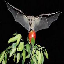

In [36]:
img = image.load_img('/content/animals/animals/bat/003bd60fa9.jpg',target_size =(64,64))
img

In [37]:
x = image.img_to_array(img) # converting the image into array
x = np.expand_dims(x,axis = 0) # expanding dimensions
pred = np.argmax(model.predict(x)) # predicting the higher probability index
op = ['bears','crows','elephants','rats']
op[pred]

1/1 [==============================] - 0s 108ms/step


'crows'

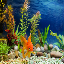

In [39]:
img = image.load_img('/content/animals/animals/goldfish/0caa357518.jpg',target_size =(64,64))
img

In [40]:
x = image.img_to_array(img) # converting the image into array
x = np.expand_dims(x,axis = 0) # expanding dimensions
pred = np.argmax(model.predict(x)) # predicting the higher probability index
op = ['bears','crows','elephants','rats']
op[pred]


1/1 [==============================] - 0s 25ms/step


'elephants'

In [42]:
x = image.img_to_array(img) # converting the image into array
x = np.expand_dims(x,axis = 0) # expanding dimensions
pred = np.argmax(model.predict(x)) # predicting the higher probability index
op = ['bears','crows','elephants','rats']
op[pred]

1/1 [==============================] - 0s 45ms/step


'elephants'

In [43]:
x = image.img_to_array(img) # converting the image into array
x = np.expand_dims(x,axis = 0) # expanding dimensions
pred = np.argmax(model.predict(x)) # predicting the higher probability index
op = ['bears','crows','elephants','rats']
op[pred]

1/1 [==============================] - 0s 26ms/step


'elephants'

In [49]:

import os

animal_dir = '/content/animals/animals'  # Replace this with the actual path to your animal directory
animal_names = {}
animal_directories = os.listdir(animal_dir)

for animal_name in animal_directories:
    animal_path = os.path.join(animal_dir, animal_name)
    # Your code to process each animal directory goes here



In [50]:
animal_names

{}

###One vs Rest Classification


In [52]:
path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

In [54]:
import torch


In [55]:
class dataset_new(torch.utils.data.Dataset):
    def __init__(self,data_idx,take=0.1,path=path):
        super().__init__()
        classes = os.listdir(path)
        folder_name = classes[data_idx]
        self.images = []
        self.labels = []
        self.transforms = transforms.Compose([
            transforms.Resize(256), # 256 for efficient net , 224
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ])
        for folder in classes:
            if folder==folder_name:
                limit = 1
            else:
                limit = take
            anim_fold = os.path.join(path, folder)
            for l,localpath in enumerate(os.listdir(anim_fold)):
                if(l>=limit*len(os.listdir(anim_fold))):
                    break
                img_path = os.path.join(anim_fold, localpath)
                self.images.append(img_path)
                if folder==folder_name:
                    self.labels.append(1)
                else:
                    self.labels.append(0)

    def __len__(self):
        return len(self.images)
    def __getitem__(self,idx):
        img = Image.open(self.images[idx])
        label = self.labels[idx]
        return self.transforms(img), torch.tensor(label,dtype=torch.long)

##Fold cross-validation to assess the model

In [56]:
def run_label_classification_one_vs_rest_fold(model_net, name):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    name_model = str(name)
    for i in range(90):
        print(animal_info.split()[i])
        dataset = dataset_new(i)

        kfold = KFold(n_splits=3, shuffle=True)

        print('--------------------------------')

        for fold, (train_ids, test_ids) in enumerate(kfold.split(dataset)):

            print(f'FOLD {fold}')
            print('--------------------------------')

            train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
            test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)

            train_loader = DataLoader(dataset, batch_size=32, sampler=train_subsampler, pin_memory=True, num_workers=2)
            test_loader = DataLoader(dataset, batch_size=32, sampler=test_subsampler, pin_memory=True, num_workers=2)

            model = model_net
            model.to(device)

            optimizer = optim.Adam(model.parameters(), lr=5e-5)
            train_losses = []
            test_losses = []
            train_accuracies = []
            test_accuracies = []

            for epoch in range(3):

                model.train()
                correct = 0
                total = 0
                train_loss = 0.0
                for _, (inputs, labels) in enumerate(train_loader):
                    inputs, labels = inputs.to(device), labels.to(device)
                    optimizer.zero_grad()

                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    loss.backward()
                    optimizer.step()
                    train_loss += loss.item()
                    _, predicted = outputs.max(1)
                    total += labels.size(0)
                    correct += predicted.eq(labels).sum().item()

                model.eval()
                test_loss = 0.0
                test_correct = 0
                test_total = 0
                all_labels = []
                all_predictions = []

                for inputs, labels in test_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    test_loss += loss.item()*inputs.size(0)
                    _, predicted = outputs.max(1)
                    test_total += labels.size(0)
                    test_correct += predicted.eq(labels).sum().item()
                    all_labels.extend(labels.cpu().numpy())
                    all_predictions.extend(predicted.cpu().numpy())


                test_loss = test_loss / len(test_loader)
                train_loss = train_loss/len(train_loader)
                test_accuracy = 100.0 * correct / total
                train_accuracy = 100.0 * test_correct/test_total

                train_losses.append(train_loss)
                test_losses.append(test_loss)
                train_accuracies.append(train_accuracy)
                test_accuracies.append(test_accuracy)

                print('Epoch: {} \tTraining Loss: {:.6f} \tTest Loss: {:.6f} \tTrain Accuracy {:.6f}% \tTest Accuracy: {:.2f}%'.format(
                    epoch+1,
                    train_loss,
                    test_loss,
                    train_accuracy,
                    test_accuracy
                    ))

            directory = f'/kaggle/working/one-vs-rest/{name}/{animal_info.split()[i]}/'
            os.makedirs(directory, exist_ok=True)

            plt.figure(figsize=(10, 5))
            plt.plot(train_accuracies, label='Train Accuracy')
            plt.plot(test_accuracies, label='Test Accuracy')
            plt.title('Accuracy Curve for Dataset Name: {} Fold {}'.format(animal_info.split()[i], fold))
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.savefig(os.path.join(directory, f'{fold}.png'))


            print('Confusion Matrix for fold {}'.format(fold))
            print(confusion_matrix(all_labels, all_predictions))


In [57]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=fec54fdb40947424373a51b7ce010a8498577e2a057f0cb42014eb1918255b41
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


##Generate classification matrices for visualization.

In [59]:
import torch.nn as nn


In [61]:
animal_info = "information about animals"


In [63]:

    from sklearn import datasets
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import classification_report, confusion_matrix

In [64]:

    wine = datasets.load_wine()
    X = wine.data
    y = wine.target

In [65]:
    class_names = wine.target_names

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [67]:
classifier_tree = DecisionTreeClassifier()
y_predict = classifier_tree.fit(X_train, y_train).predict(X_test)

In [68]:
print(classification_report(y_test, y_predict, target_names=class_names))
print(confusion_matrix(y_test, y_predict))

              precision    recall  f1-score   support

     class_0       0.88      0.93      0.90        15
     class_1       0.88      0.92      0.90        24
     class_2       0.92      0.80      0.86        15

    accuracy                           0.89        54
   macro avg       0.89      0.88      0.89        54
weighted avg       0.89      0.89      0.89        54

[[14  1  0]
 [ 1 22  1]
 [ 1  2 12]]


##Convolutional Layer Visualization:
  Plot the output of all convolutional layers and discuss the insights on automatically created features.


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 74.7MB/s]


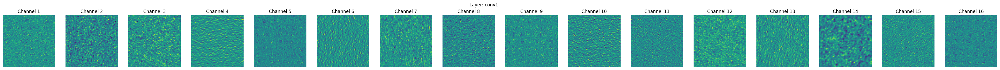

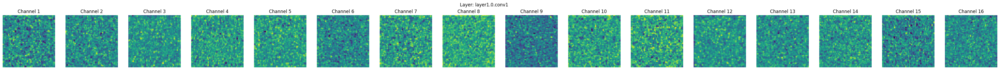

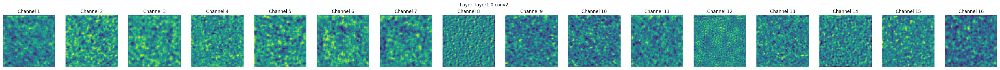

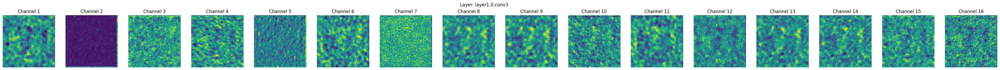

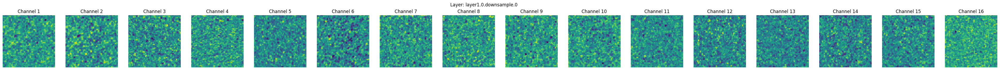

...

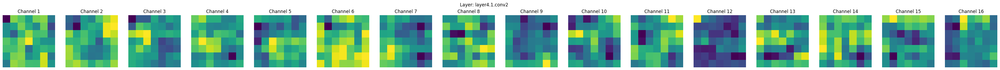

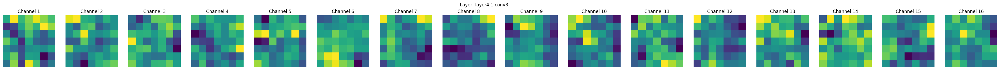

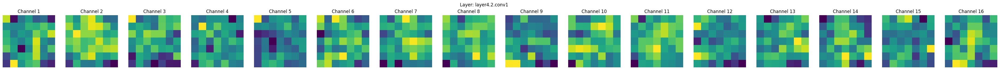

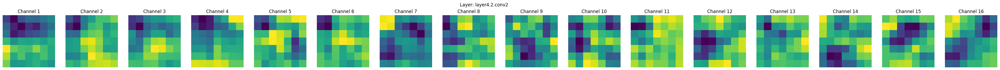

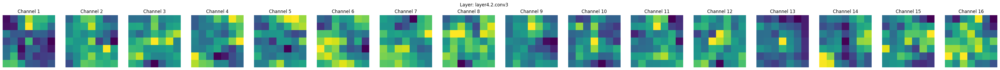

In [69]:
import torch
import torchvision.models as models
import matplotlib.pyplot as plt

# Load a pre-trained model (for example, ResNet50)
model = models.resnet50(pretrained=True)

# Define a hook to extract the output of each convolutional layer
activation = {}

def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

# Register the hook for all convolutional layers in the model
for name, layer in model.named_modules():
    if isinstance(layer, torch.nn.Conv2d):
        layer.register_forward_hook(get_activation(name))

# Load a sample image (you can replace this with your own image)
sample_image = torch.randn(1, 3, 224, 224)  # Assuming input size of 224x224

# Pass the sample image through the model
output = model(sample_image)

# Visualize the output of each convolutional layer
for name, output_activation in activation.items():
    if len(output_activation.shape) == 4:  # Check if the output is from a convolutional layer
        num_channels = output_activation.shape[1]  # Number of channels in the output
        num_plots = min(num_channels, 16)  # Limit the number of channels to visualize
        fig, axes = plt.subplots(1, num_plots, figsize=(num_plots * 3, 3))
        for i in range(num_plots):
            axes[i].imshow(output_activation[0, i].cpu(), cmap='viridis')  # Visualize the activation map
            axes[i].axis('off')
            axes[i].set_title(f'Channel {i+1}')
        plt.suptitle(f'Layer: {name}')
        plt.show()


In [71]:
from PIL import Image


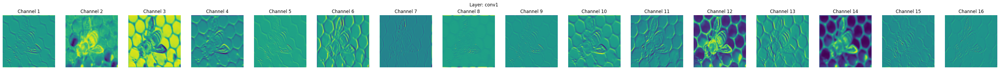

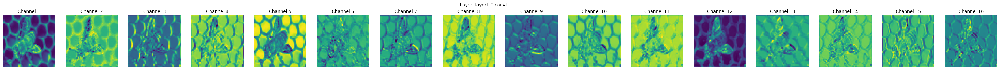

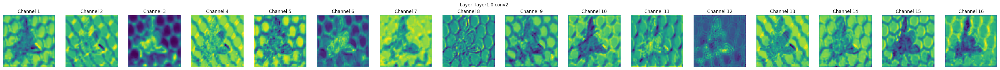

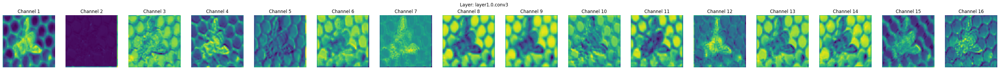

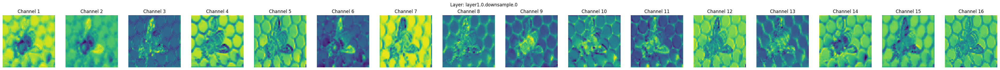

...

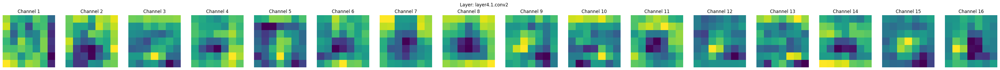

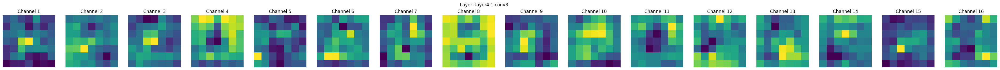

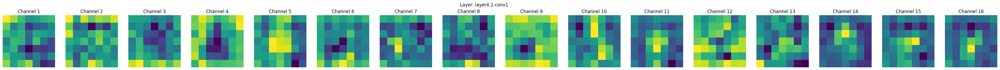

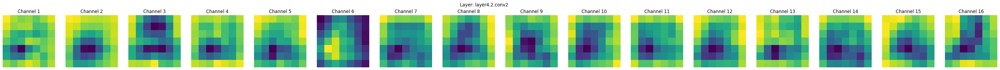

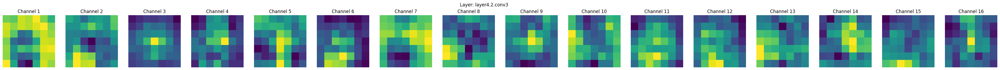

In [73]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Load a pretrained CNN model
model = models.resnet50(pretrained=True)
model.eval()

# Define a function to preprocess the image
def preprocess_image(image_path):
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = preprocess(Image.open(image_path).convert('RGB'))
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Load a sample image
image_path = '/content/animals/animals/bee/0ec9efe6d8.jpg'  # Replace with your own image path
image = preprocess_image(image_path)

# Define a hook to extract features from convolutional layers
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

# Register the hook for all convolutional layers
for name, layer in model.named_modules():
    if isinstance(layer, nn.Conv2d):
        layer.register_forward_hook(get_activation(name))

# Pass the image through the model
output = model(image)

# Visualize the features extracted by each convolutional layer
for name, output_activation in activation.items():
    if len(output_activation.shape) == 4:  # Check if the output is from a convolutional layer
        num_channels = output_activation.shape[1]  # Number of channels in the output
        num_plots = min(num_channels, 16)  # Limit the number of channels to visualize
        fig, axes = plt.subplots(1, num_plots, figsize=(num_plots * 3, 3))
        for i in range(num_plots):
            axes[i].imshow(output_activation[0, i].cpu(), cmap='viridis')  # Visualize the activation map
            axes[i].axis('off')
            axes[i].set_title(f'Channel {i+1}')
        plt.suptitle(f'Layer: {name}')
        plt.show()


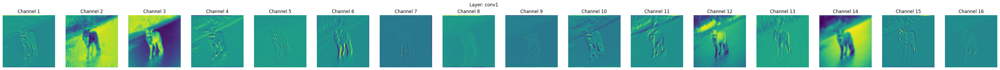

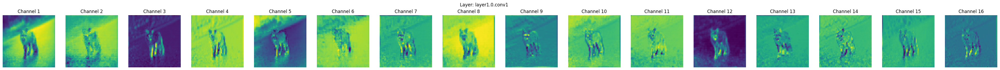

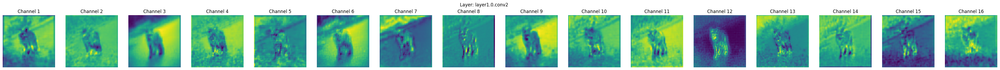

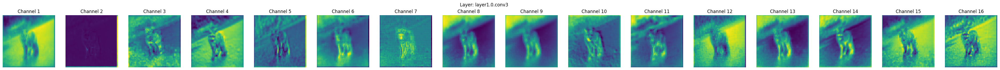

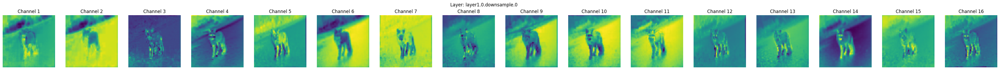

...

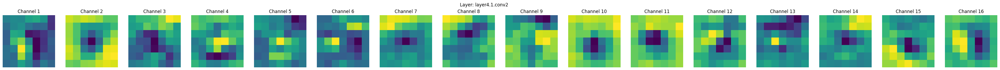

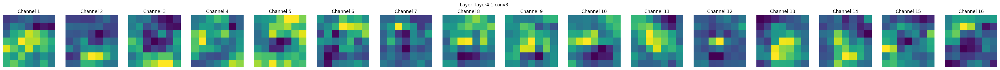

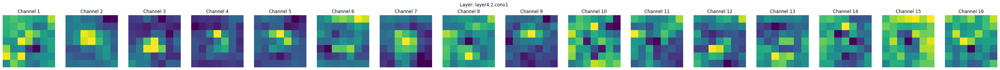

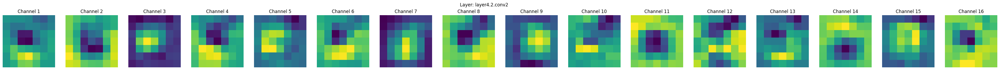

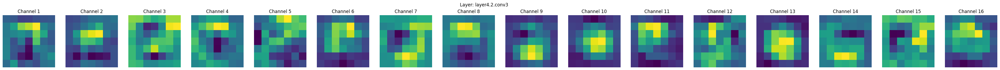

In [75]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load a pretrained CNN model
model = models.resnet50(pretrained=True)
model.eval()

# Define a function to preprocess the image
def preprocess_image(image_path):
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = preprocess(Image.open(image_path).convert('RGB'))
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Load a sample image
image_path = '/content/animals/animals/fox/05f072dffb.jpg'  # Replace with your own image path
image = preprocess_image(image_path)

# Define a hook to extract features from all convolutional layers
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

# Register the hook for all convolutional layers
for name, layer in model.named_modules():
    if isinstance(layer, nn.Conv2d):
        layer.register_forward_hook(get_activation(name))

# Pass the image through the model
output = model(image)

# Plot the output of all convolutional layers
for name, output_activation in activation.items():
    if isinstance(output_activation, torch.Tensor) and len(output_activation.shape) == 4:  # Check if the output is from a convolutional layer
        num_channels = output_activation.shape[1]  # Number of channels in the output
        num_plots = min(num_channels, 16)  # Limit the number of channels to visualize
        fig, axes = plt.subplots(1, num_plots, figsize=(num_plots * 3, 3))
        for i in range(num_plots):
            axes[i].imshow(output_activation[0, i].cpu(), cmap='viridis')  # Visualize the activation map
            axes[i].axis('off')
            axes[i].set_title(f'Channel {i+1}')
        plt.suptitle(f'Layer: {name}')
        plt.show()
